# Drinking Water Quality


### Data Import


In [3]:
# @title library and data import
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)

%matplotlib inline

data = pd.read_excel("../data/DataDivi.xlsx", sheet_name=None)
df_wet = data["Wet"]
df_dry = data["Dry"]
df_combine = pd.concat([df_wet, df_dry], axis=0)

In [4]:
df_wet.columns.tolist()

['OBJECTID',
 'Sample ID',
 'Division',
 'District',
 'Upazila',
 'soil tract',
 'GST_LABEL',
 'GST_CODE',
 'Depth Category',
 'Depth(m)',
 'Sampling Date',
 'Latitude',
 'Longitude',
 'GW Level(m)',
 'Water Type',
 'Temperature©',
 'Turbidity(NTU)',
 'pH',
 'ORP(mv)',
 'EC(µS/cm)',
 'Salinity(ppt)',
 'DO(mg/l)',
 'TDS(mg/l)',
 'Na(mg/l)',
 'K(mg/l)',
 'Mg2(mg/l)',
 'Ca2(mg/l)',
 'NO3(mg/l)',
 'SO42(mg/l)',
 'PO43(mg/l)',
 'CO3(mg/l)',
 'HCO3(mg/l)',
 'Cl(mg/l)',
 'Br(mg/l)',
 'I(mg/l)',
 'Al3(mg/l)',
 'Cu2(mg/l)',
 'Fe2(mg/l)',
 'Mn2(mg/l)',
 'Cr3(mg/l)',
 'B(mg/l)',
 'As(µg/l)']

In [5]:
# @title Missing value analysis
def analyze_missing_values(df):
    # Check if there are any NaN values
    has_nan = df.isnull().values.any()

    # Count total number of NaN values
    total_nan_count = df.isnull().sum().sum()

    # Get rows with NaN values
    rows_with_nan = df[df.isnull().any(axis=1)]

    # Get columns with NaN values
    columns_with_nan = df.columns[df.isnull().any()].tolist()

    # Get row indices with missing values
    rows_with_nan = df[df.isnull().any(axis=1)].index.tolist()

    # Print the analysis
    print("\n=== Missing Values Analysis ===")
    print(f"\nDataFrame contains missing values: {has_nan}")
    print(f"Total number of missing values: {total_nan_count}")
    print(f"Number of rows with missing values: {len(rows_with_nan)}")
    print(f"Number of columns with missing values: {len(columns_with_nan)}")
    print("\nColumns with missing values:")
    print(columns_with_nan)

    print("\nRow indices containing missing values:")
    print(rows_with_nan)

In [6]:
analyze_missing_values(df_wet)


=== Missing Values Analysis ===

DataFrame contains missing values: False
Total number of missing values: 0
Number of rows with missing values: 0
Number of columns with missing values: 0

Columns with missing values:
[]

Row indices containing missing values:
[]


In [7]:
analyze_missing_values(df_dry)


=== Missing Values Analysis ===

DataFrame contains missing values: False
Total number of missing values: 0
Number of rows with missing values: 0
Number of columns with missing values: 0

Columns with missing values:
[]

Row indices containing missing values:
[]


### KMO Test and Bartlett’s Test


In [8]:
# @title test function
from factor_analyzer.factor_analyzer import calculate_kmo, calculate_bartlett_sphericity


def perform_factor_analysis_tests(df):
    try:
        # Calculate KMO scores
        kmo_all, kmo_model = calculate_kmo(df)

        # Calculate Bartlett's test
        chi_square_value, p_value = calculate_bartlett_sphericity(df)

        # Print results
        print(f"KMO Test Value: {kmo_model:.3f}")
        print(f"Bartlett's Test:")
        print(f"Chi Square Value: {chi_square_value:.3f}")
        print(f"p-value: {p_value:.10f}")

    except Exception as e:
        print(f"Error during analysis: {str(e)}")
        return None

In [9]:
drop_columns = [
    "OBJECTID",
    "Sample ID",
    "Division",
    "District",
    "Upazila",
    "soil tract",
    "GST_LABEL",
    "GST_CODE",
    "Depth Category",
    "Depth(m)",
    "Sampling Date",
    "Latitude",
    "Longitude",
    "GW Level(m)",
    "Water Type",
]
df_wet_cleaned = df_wet.drop(columns=drop_columns)
df_dry_cleaned = df_dry.drop(columns=drop_columns)
df_combine_cleaned = df_combine.drop(columns=drop_columns)


In [10]:
perform_factor_analysis_tests(df_wet_cleaned)

KMO Test Value: 0.866
Bartlett's Test:
Chi Square Value: 16748.528
p-value: 0.0000000000


In [11]:
perform_factor_analysis_tests(df_dry_cleaned)

KMO Test Value: 0.814
Bartlett's Test:
Chi Square Value: 14535.811
p-value: 0.0000000000


In [12]:
perform_factor_analysis_tests(df_combine_cleaned)

KMO Test Value: 0.833
Bartlett's Test:
Chi Square Value: 25660.820
p-value: 0.0000000000


### PCA


In [13]:
# @title Standardize the data
from sklearn.preprocessing import StandardScaler


def standardize_data(df):
    scaler = StandardScaler()
    return pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

In [14]:
df_wet_scaled = standardize_data(df_wet_cleaned)
df_dry_scaled = standardize_data(df_dry_cleaned)
df_combine_scaled = standardize_data(df_combine_cleaned)

In [15]:
# @title Box plot for Z-score Variability of Parameters


def box_plot_zscore_variability(df, title):
    plt.figure(figsize=(10, 8))
    sns.boxplot(data=df, orient="h", palette="Set2")

    plt.title(f"Z-score Variability of {title}", fontsize=16)
    plt.xlabel("Z-score")
    plt.ylabel("Parameters")
    plt.show()

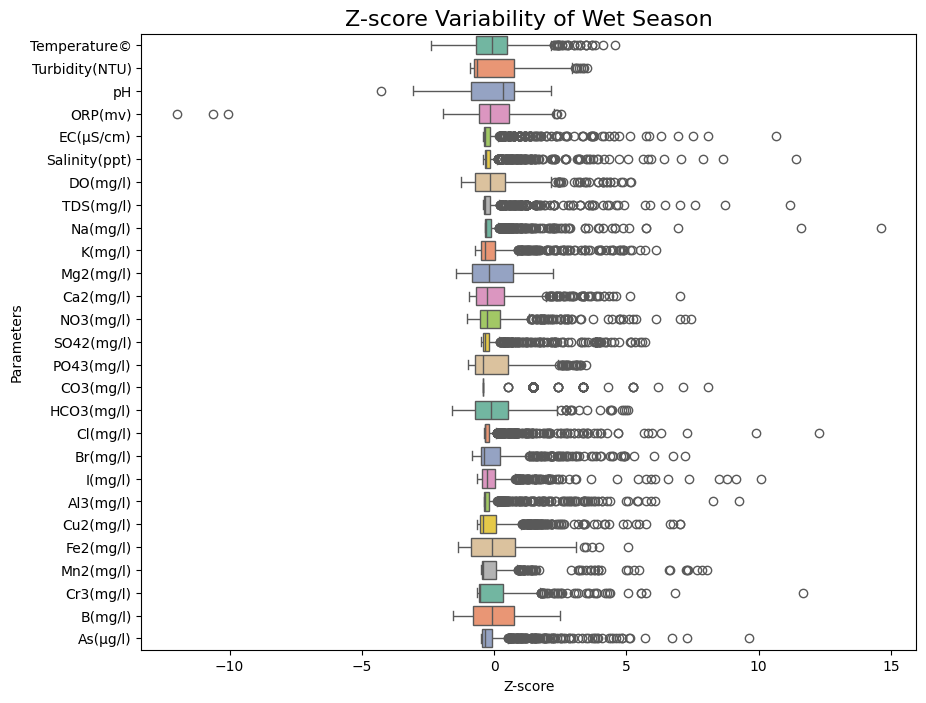

In [16]:
box_plot_zscore_variability(df_wet_scaled, "Wet Season")

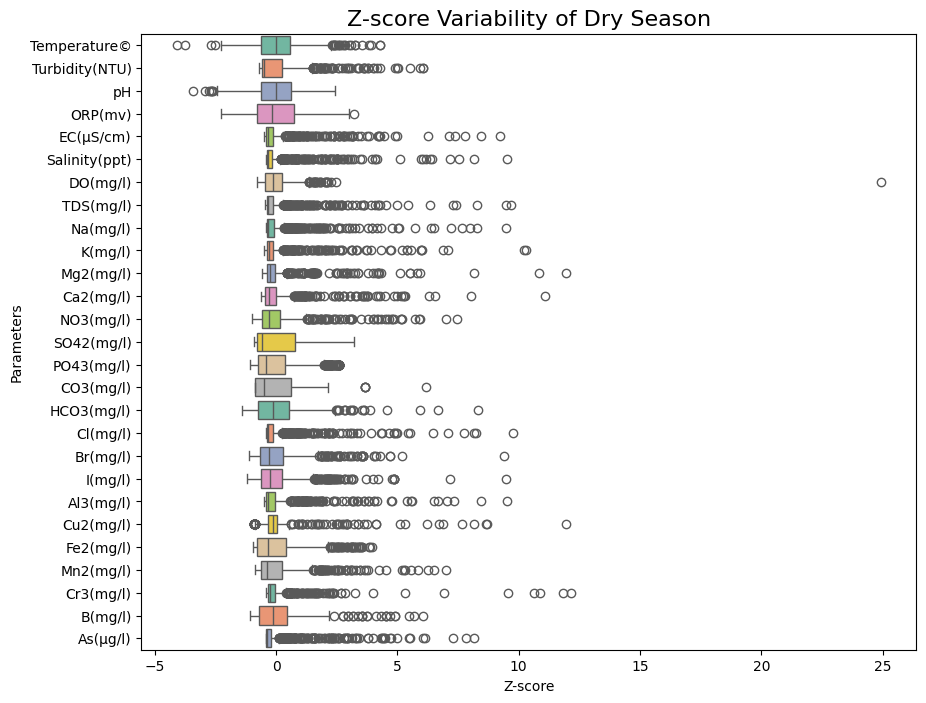

In [17]:
box_plot_zscore_variability(df_dry_scaled, "Dry Season")

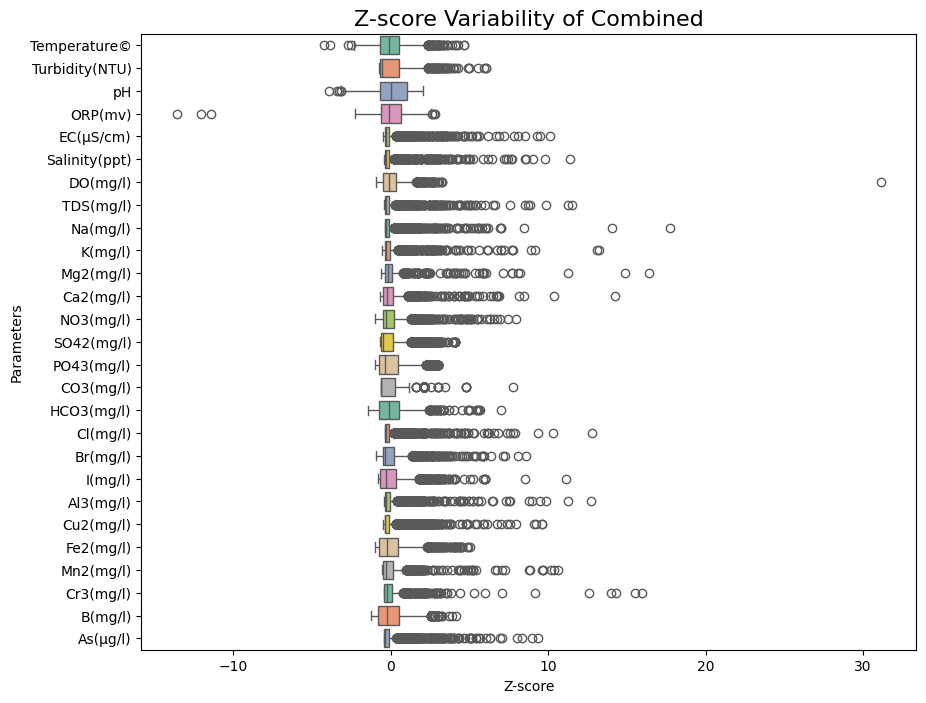

In [18]:
box_plot_zscore_variability(df_combine_scaled, "Combined")

In [19]:
# @title Outlier


def detect_outliers(df, methods=["zscore", "iqr"]):
    results = {}

    if "zscore" in methods:
        # Z-score method (standard deviation)
        zscore_outliers = {}
        for column in df.select_dtypes(include=[np.number]).columns:
            z_scores = np.abs((df[column] - df[column].mean()) / df[column].std())
            outliers = df[z_scores > 3][column]  # Values beyond 3 standard deviations
            zscore_outliers[column] = {
                "outlier_indices": outliers.index.tolist(),
                "outlier_values": outliers.values.tolist(),
                "outlier_count": len(outliers),
            }
        results["zscore"] = zscore_outliers

    if "iqr" in methods:
        # IQR method
        iqr_outliers = {}
        for column in df.select_dtypes(include=[np.number]).columns:
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)][
                column
            ]
            iqr_outliers[column] = {
                "outlier_indices": outliers.index.tolist(),
                "outlier_values": outliers.values.tolist(),
                "outlier_count": len(outliers),
                "bounds": {"lower": lower_bound, "upper": upper_bound},
            }
        results["iqr"] = iqr_outliers

    return results


def remove_outliers(df, method="iqr"):
    df_clean = df.copy()

    if method == "zscore":
        for column in df.select_dtypes(include=[np.number]).columns:
            z_scores = np.abs((df[column] - df[column].mean()) / df[column].std())
            df_clean = df_clean[z_scores <= 3]

    elif method == "iqr":
        for column in df.select_dtypes(include=[np.number]).columns:
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            df_clean = df_clean[
                (df_clean[column] >= lower_bound) & (df_clean[column] <= upper_bound)
            ]

    return df_clean


def print_outlier_summary(outlier_results):
    print("\n=== Outlier Analysis Summary ===")

    for method, results in outlier_results.items():
        print(f"\nMethod: {method.upper()}")
        for column, data in results.items():
            print(f"\nColumn: {column}")
            print(f"Number of outliers: {data['outlier_count']}")
            if data["outlier_count"] > 0:
                print(f"Outlier values: {data['outlier_values']}")
                if method == "iqr":
                    print(
                        f"Bounds: Lower = {data['bounds']['lower']:.2f}, "
                        f"Upper = {data['bounds']['upper']:.2f}"
                    )

In [20]:
# @title Perform PCA and Scree plot dataframe
from sklearn.decomposition import PCA


def perform_pca(df, title=""):
    pca = PCA(n_components=None)

    pca_data = pca.fit_transform(df)

    # convert the PCA-transformed data to a DataFrame
    pca_df = pd.DataFrame(
        pca_data, columns=[f"PC{i + 1}" for i in range(pca_data.shape[1])]
    )

    # Create a DataFrame for Scree plot
    eigenvalues = pca.explained_variance_

    explained_variance = pca.explained_variance_ratio_

    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

    components = range(1, len(eigenvalues) + 1)

    scree_df = pd.DataFrame(
        {
            "Principal Component": components,
            "Eigen Value": eigenvalues,
            "Variance": explained_variance,
            "Cumulative Variance": cumulative_variance * 100,
        }
    )

    return pca_df, scree_df


pca_wet, scree_wet = perform_pca(df_wet_scaled)
pca_dry, scree_dry = perform_pca(df_dry_scaled)
pca_combined, scree_combined = perform_pca(df_combine_scaled)

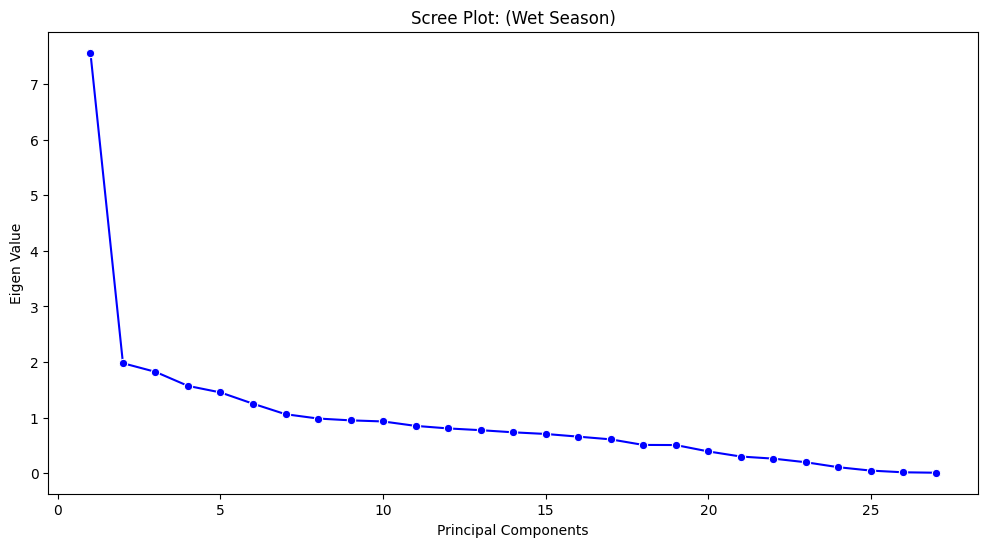

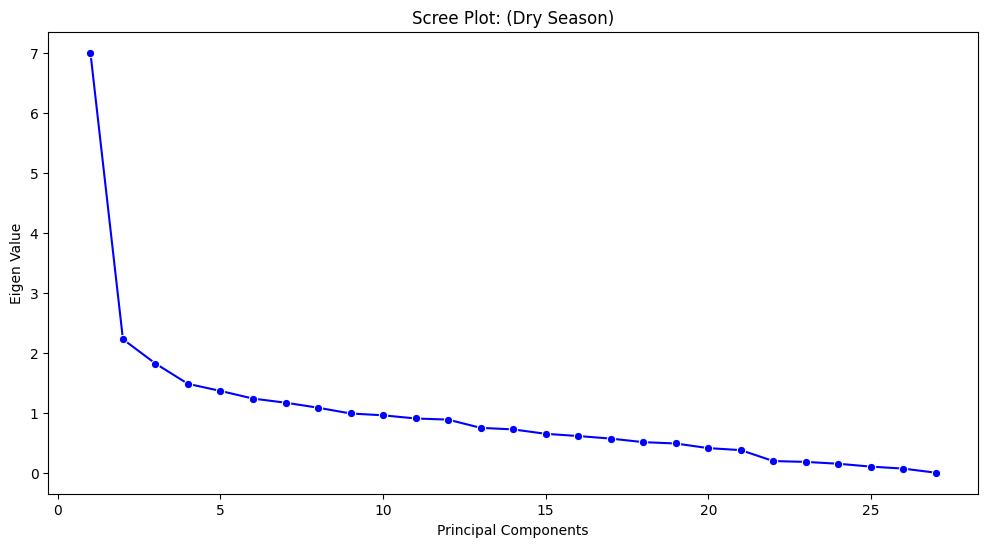

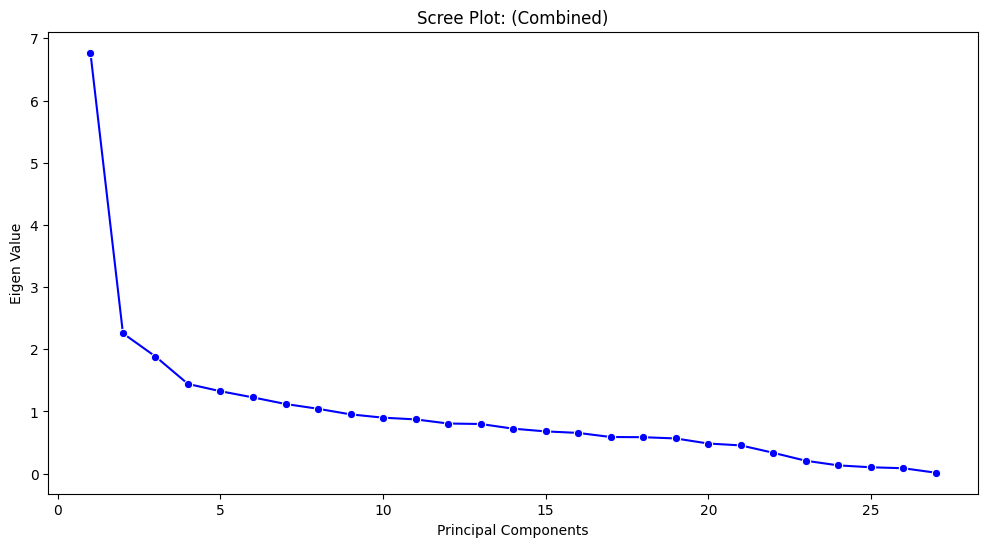

In [21]:
# @title Scree plot: Eigenvalues VS Principal components


def scree_plot(df_scree, title=""):
    plt.figure(figsize=(12, 6))
    sns.lineplot(
        x="Principal Component", y="Eigen Value", data=df_scree, marker="o", color="b"
    )

    plt.xlabel("Principal Components")
    plt.ylabel("Eigen Value")
    plt.title(f"Scree Plot: ({title})", fontsize=12)
    plt.show()


scree_plot(scree_wet, "Wet Season")
scree_plot(scree_dry, "Dry Season")
scree_plot(scree_combined, "Combined")

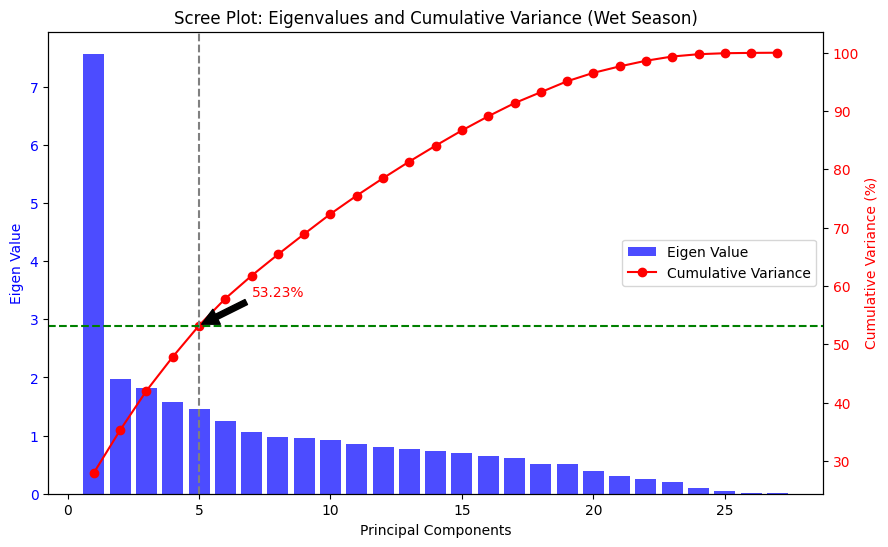

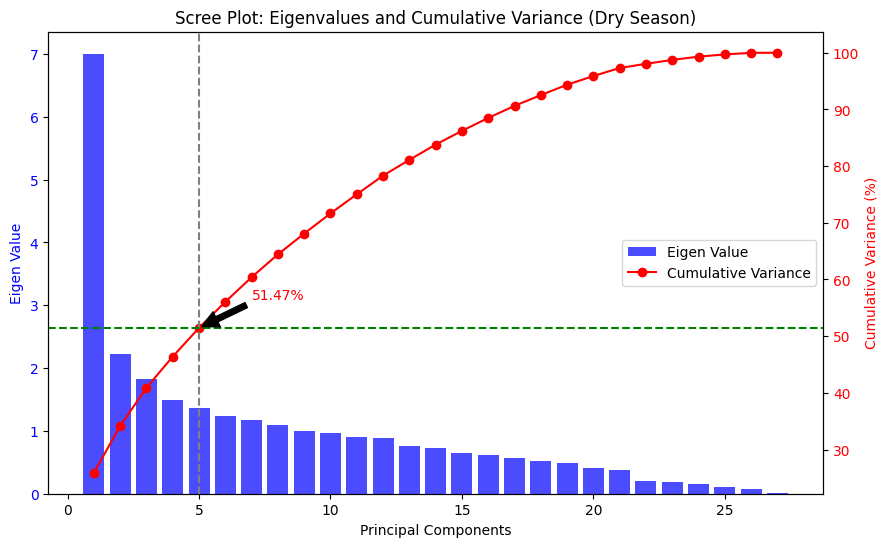

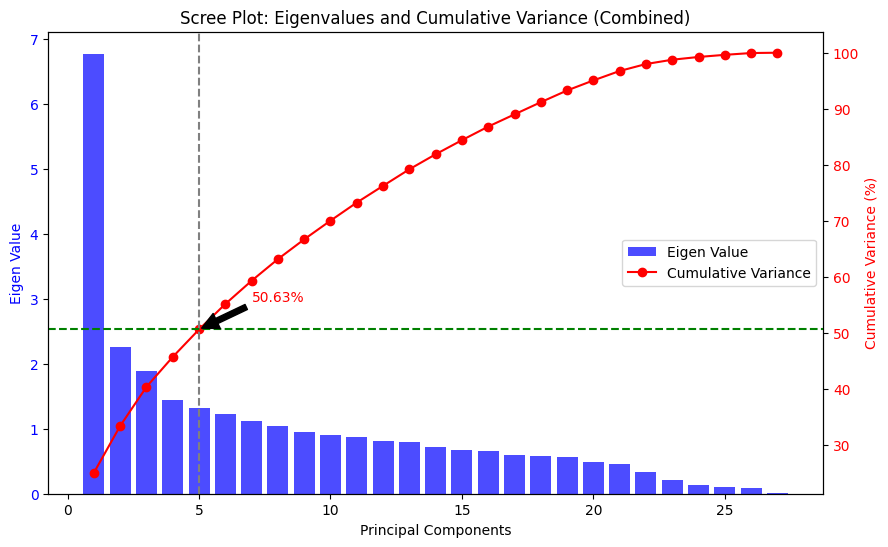

In [22]:
# @title Scree Plot: Eigenvalues and Cumulative Variance


def scree_plot_eigenvalues_cumulative_variance(df_scree, title=""):
    # Set figure size
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot Eigenvalues as a bar chart on the left y-axis
    ax1.bar(
        df_scree["Principal Component"],
        df_scree["Eigen Value"],
        color="b",
        alpha=0.7,
        label="Eigen Value",
    )
    ax1.set_xlabel("Principal Components")
    ax1.set_ylabel("Eigen Value", color="b")
    ax1.tick_params(axis="y", labelcolor="b")

    # plt.axhline(y=1, color='gray', linestyle='--')

    # Create a second y-axis for cumulative variance
    ax2 = ax1.twinx()
    ax2.plot(
        df_scree["Principal Component"],
        df_scree["Cumulative Variance"],
        color="r",
        marker="o",
        label="Cumulative Variance",
    )
    ax2.set_ylabel("Cumulative Variance (%)", color="r")
    ax2.tick_params(axis="y", labelcolor="r")

    # Add  and vertical lines
    plt.axvline(x=5, color="gray", linestyle="--")

    # Find the y-coordinate of the intersection point
    intersection_y = df_scree.loc[
        df_scree["Principal Component"] == 5, "Cumulative Variance"
    ].values[0]

    # Draw a horizontal line at the intersection point
    plt.axhline(y=intersection_y, color="green", linestyle="--")

    # Annotate the intersection point
    ax2.annotate(
        f"{intersection_y:.2f}%",
        xy=(5, intersection_y),
        xytext=(7, intersection_y + 5),
        arrowprops=dict(facecolor="black", shrink=0.05),
        fontsize=10,
        color="r",
    )

    # Add title
    plt.title(f"Scree Plot: Eigenvalues and Cumulative Variance ({title})", fontsize=12)

    # Show legends
    # Combine legends
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc="right")

    # Show plot
    plt.show()


scree_plot_eigenvalues_cumulative_variance(scree_wet, "Wet Season")
scree_plot_eigenvalues_cumulative_variance(scree_dry, "Dry Season")
scree_plot_eigenvalues_cumulative_variance(scree_combined, "Combined")


In [23]:
# @title Loadings of each components on PC
def loadings(df, title=""):
    pca = PCA(n_components=5)
    pca.fit(df)

    loadings = pca.components_.T

    # Create a DataFrame for better readability
    loadings_df = pd.DataFrame(
        loadings[:, :5],
        columns=[f"PC{i + 1}" for i in range(5)],
        index=df.columns,
    )

    return loadings_df


loadings_wet = loadings(df_wet_scaled, "Wet Season")
loadings_dry = loadings(df_dry_scaled, "Dry Season")
loadings_combined = loadings(df_combine_scaled, "Combined")


In [24]:
#  @title Parameters loadings (>0.3)
def parameters_loadings(loadings_df):
    result_dict = {}
    threshold = 0.3

    for col in loadings_df.columns:
        temp_df = loadings_df[abs(loadings_df[col]) > threshold]
        temp_dict = {}
        for index, row in temp_df.iterrows():
            temp_dict[index] = round(row[col], 3)
        if temp_dict:
            result_dict[col] = temp_dict

    return result_dict


result_dict_wet = parameters_loadings(loadings_wet)
result_dict_dry = parameters_loadings(loadings_dry)
result_dict_combined = parameters_loadings(loadings_combined)

result_dict_dry


{'PC1': {'Na(mg/l)': np.float64(0.35),
  'K(mg/l)': np.float64(0.324),
  'Mg2(mg/l)': np.float64(0.331),
  'Ca2(mg/l)': np.float64(0.328),
  'Cl(mg/l)': np.float64(0.357)},
 'PC2': {'pH': np.float64(-0.321),
  'ORP(mv)': np.float64(0.41),
  'PO43(mg/l)': np.float64(-0.4),
  'As(µg/l)': np.float64(-0.378)},
 'PC3': {'CO3(mg/l)': np.float64(-0.349),
  'HCO3(mg/l)': np.float64(-0.317),
  'Al3(mg/l)': np.float64(0.403),
  'Fe2(mg/l)': np.float64(0.473),
  'Mn2(mg/l)': np.float64(0.319)},
 'PC4': {'Turbidity(NTU)': np.float64(0.479),
  'Salinity(ppt)': np.float64(0.319)},
 'PC5': {'DO(mg/l)': np.float64(0.398),
  'SO42(mg/l)': np.float64(0.46),
  'HCO3(mg/l)': np.float64(0.335)}}

In [25]:
# @title Selected parameter after PCA
def selected_parameters(result_dict):
    parameter_pca = []

    for pc in result_dict.values():
        parameter_pca.extend(pc.keys())

    parameter_pca = list(set(parameter_pca))

    return parameter_pca


parameter_pca_dry = selected_parameters(result_dict_dry)
parameter_pca_wet = selected_parameters(result_dict_wet)
parameter_pca_combined = selected_parameters(result_dict_combined)

print(
    f"Dry Season: total parameter {len(parameter_pca_dry)}",
    parameter_pca_dry,
)
print(
    f"\nWet Season: total parameter {len(parameter_pca_wet)}",
    parameter_pca_wet,
)

print(
    f"\nCombined Season: total parameter {len(parameter_pca_combined)}",
    parameter_pca_combined,
)


Dry Season: total parameter 18 ['K(mg/l)', 'Fe2(mg/l)', 'Turbidity(NTU)', 'Na(mg/l)', 'Cl(mg/l)', 'DO(mg/l)', 'pH', 'Al3(mg/l)', 'HCO3(mg/l)', 'Mn2(mg/l)', 'SO42(mg/l)', 'Ca2(mg/l)', 'As(µg/l)', 'Salinity(ppt)', 'PO43(mg/l)', 'CO3(mg/l)', 'Mg2(mg/l)', 'ORP(mv)']

Wet Season: total parameter 19 ['Turbidity(NTU)', 'Cu2(mg/l)', 'Salinity(ppt)', 'PO43(mg/l)', 'CO3(mg/l)', 'Br(mg/l)', 'TDS(mg/l)', 'DO(mg/l)', 'HCO3(mg/l)', 'Ca2(mg/l)', 'Temperature©', 'B(mg/l)', 'K(mg/l)', 'EC(µS/cm)', 'Fe2(mg/l)', 'Na(mg/l)', 'Cl(mg/l)', 'As(µg/l)', 'pH']

Combined Season: total parameter 22 ['Turbidity(NTU)', 'Cu2(mg/l)', 'SO42(mg/l)', 'Salinity(ppt)', 'PO43(mg/l)', 'CO3(mg/l)', 'TDS(mg/l)', 'DO(mg/l)', 'Al3(mg/l)', 'HCO3(mg/l)', 'Ca2(mg/l)', 'B(mg/l)', 'Mn2(mg/l)', 'ORP(mv)', 'K(mg/l)', 'EC(µS/cm)', 'Fe2(mg/l)', 'Na(mg/l)', 'Cl(mg/l)', 'I(mg/l)', 'As(µg/l)', 'pH']


### Correlation Matrix


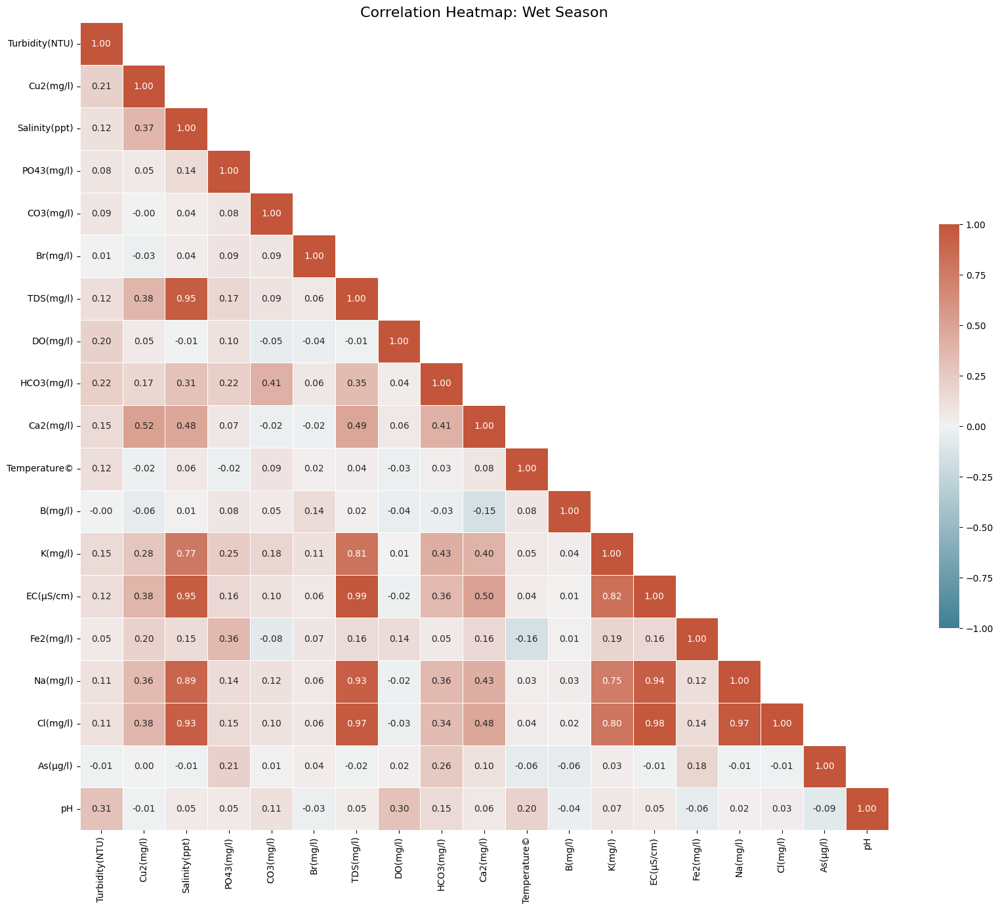

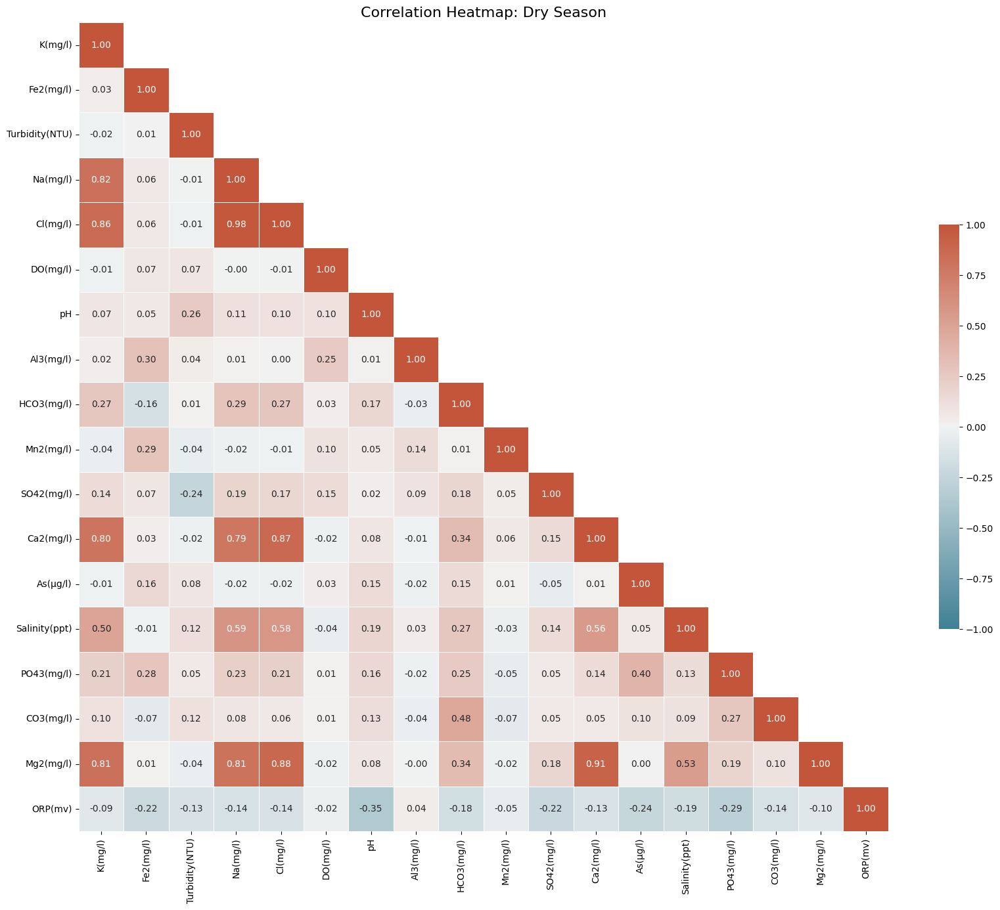

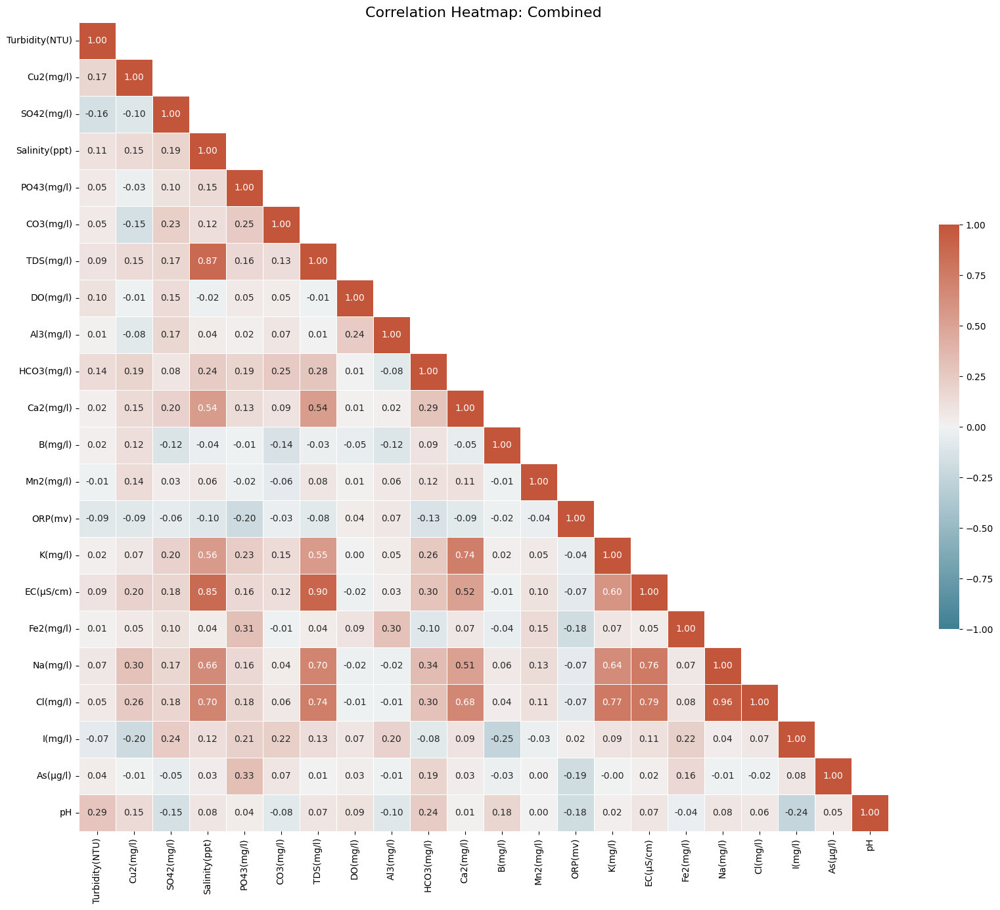

In [26]:
# @title Heatmap for correlation


def heatmap_correlation(df_scaled, parameter_pca, title=""):
    selected_df = df_scaled[parameter_pca]

    corr_matrix = selected_df.corr(method="pearson")

    # corr_matrix = scaled_df.corr(method='spearman')

    # plot the correlation matrix
    # Create a mask for the upper triangle
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool), k=1)

    # Set up the matplotlib figure
    fig, ax = plt.subplots(figsize=(20, 16))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(220, 20, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(
        corr_matrix,
        mask=mask,
        cmap=cmap,
        vmax=1,
        vmin=-1,
        center=0,
        square=True,
        linewidths=0.5,
        cbar_kws={"shrink": 0.5},
        annot=True,
        fmt=".2f",
    )

    plt.title(f"Correlation Heatmap: {title}", fontsize=16)
    plt.show()

    return corr_matrix


corr_matrix_wet = heatmap_correlation(df_wet_scaled, parameter_pca_wet, "Wet Season")
corr_matrix_dry = heatmap_correlation(df_dry_scaled, parameter_pca_dry, "Dry Season")
corr_matrix_combine = heatmap_correlation(
    df_combine_scaled, parameter_pca_combined, "Combined"
)


In [27]:
# @title Highly correlated pairs
def highly_correlated_pairs(corr_matrix, threshold_cor=0.7, title=""):
    # Find pairs of highly correlated variables
    high_corr_pairs = np.where(np.abs(corr_matrix) > threshold_cor)
    high_corr_pairs = [
        (corr_matrix.index[x], corr_matrix.columns[y])
        for x, y in zip(*high_corr_pairs)
        if x != y and x < y
    ]

    # Display the highly correlated pairs
    print(
        f"\n\033[1mHighly correlated pairs for {title} (threshold_cor > {threshold_cor}):\033[0m"
    )
    for pair in high_corr_pairs:
        print(f"{pair[0]} and {pair[1]}: {corr_matrix.loc[pair[0], pair[1]]:.2f}")

    return high_corr_pairs


high_corr_pairs_wet = highly_correlated_pairs(corr_matrix_wet, 0.7, "Wet Season")

high_corr_pairs_dry = highly_correlated_pairs(corr_matrix_dry, 0.7, "Dry Season")

high_corr_pairs_combine = highly_correlated_pairs(corr_matrix_combine, 0.7, "Combined")



Highly correlated pairs for Wet Season (threshold_cor > 0.7):
Salinity(ppt) and TDS(mg/l): 0.95
Salinity(ppt) and K(mg/l): 0.77
Salinity(ppt) and EC(µS/cm): 0.95
Salinity(ppt) and Na(mg/l): 0.89
Salinity(ppt) and Cl(mg/l): 0.93
TDS(mg/l) and K(mg/l): 0.81
TDS(mg/l) and EC(µS/cm): 0.99
TDS(mg/l) and Na(mg/l): 0.93
TDS(mg/l) and Cl(mg/l): 0.97
K(mg/l) and EC(µS/cm): 0.82
K(mg/l) and Na(mg/l): 0.75
K(mg/l) and Cl(mg/l): 0.80
EC(µS/cm) and Na(mg/l): 0.94
EC(µS/cm) and Cl(mg/l): 0.98
Na(mg/l) and Cl(mg/l): 0.97

Highly correlated pairs for Dry Season (threshold_cor > 0.7):
K(mg/l) and Na(mg/l): 0.82
K(mg/l) and Cl(mg/l): 0.86
K(mg/l) and Ca2(mg/l): 0.80
K(mg/l) and Mg2(mg/l): 0.81
Na(mg/l) and Cl(mg/l): 0.98
Na(mg/l) and Ca2(mg/l): 0.79
Na(mg/l) and Mg2(mg/l): 0.81
Cl(mg/l) and Ca2(mg/l): 0.87
Cl(mg/l) and Mg2(mg/l): 0.88
Ca2(mg/l) and Mg2(mg/l): 0.91

Highly correlated pairs for Combined (threshold_cor > 0.7):
Salinity(ppt) and TDS(mg/l): 0.87
Salinity(ppt) and EC(µS/cm): 0.85
TDS(mg/l) a

In [28]:
# @title list of highly correlated parameters
def highly_correlated_parameters(high_corr_pairs, title=""):
    highly_correlated_parameters = []

    # Iterate over the highly correlated pairs
    for pair in high_corr_pairs:
        # Add the parameters to the list
        highly_correlated_parameters.extend(pair)

    # Remove duplicates
    highly_correlated_parameters = list(set(highly_correlated_parameters))
    print(
        f"\n\033[1mHighly correlated parameters for {title}:\033[0m",
        highly_correlated_parameters,
    )

    return highly_correlated_parameters


highly_correlated_parameters_wet = highly_correlated_parameters(
    high_corr_pairs_wet, "Wet Season"
)

highly_correlated_parameters_dry = highly_correlated_parameters(
    high_corr_pairs_dry, "Dry Season"
)

highly_correlated_parameters_combine = highly_correlated_parameters(
    high_corr_pairs_combine, "Combined"
)



Highly correlated parameters for Wet Season: ['EC(µS/cm)', 'K(mg/l)', 'Na(mg/l)', 'TDS(mg/l)', 'Cl(mg/l)', 'Salinity(ppt)']

Highly correlated parameters for Dry Season: ['K(mg/l)', 'Na(mg/l)', 'Cl(mg/l)', 'Ca2(mg/l)', 'Mg2(mg/l)']

Highly correlated parameters for Combined: ['EC(µS/cm)', 'K(mg/l)', 'Na(mg/l)', 'Cl(mg/l)', 'TDS(mg/l)', 'Ca2(mg/l)', 'Salinity(ppt)']


### Selected Parameter after correlation


In [29]:
# Remove highly correlated parameters from parameter_pca


def remove_highly_correlated_parameters(parameter_pca, highly_correlated_parameters):
    return [
        param for param in parameter_pca if param not in highly_correlated_parameters
    ]


selected_parameters_dry = remove_highly_correlated_parameters(
    parameter_pca_dry, highly_correlated_parameters_dry
)

selected_parameters_wet = remove_highly_correlated_parameters(
    parameter_pca_wet, highly_correlated_parameters_wet
)

selected_parameters_combine = remove_highly_correlated_parameters(
    parameter_pca_combined, highly_correlated_parameters_combine
)


print(
    f"Dry Season: total parameter {len(selected_parameters_dry)}",
    selected_parameters_dry,
)
print(
    f"\nWet Season: total parameter {len(selected_parameters_wet)}",
    selected_parameters_wet,
)

print(
    f"\nCombined Season: total parameter {len(selected_parameters_combine)}",
    selected_parameters_combine,
)


Dry Season: total parameter 13 ['Fe2(mg/l)', 'Turbidity(NTU)', 'DO(mg/l)', 'pH', 'Al3(mg/l)', 'HCO3(mg/l)', 'Mn2(mg/l)', 'SO42(mg/l)', 'As(µg/l)', 'Salinity(ppt)', 'PO43(mg/l)', 'CO3(mg/l)', 'ORP(mv)']

Wet Season: total parameter 13 ['Turbidity(NTU)', 'Cu2(mg/l)', 'PO43(mg/l)', 'CO3(mg/l)', 'Br(mg/l)', 'DO(mg/l)', 'HCO3(mg/l)', 'Ca2(mg/l)', 'Temperature©', 'B(mg/l)', 'Fe2(mg/l)', 'As(µg/l)', 'pH']

Combined Season: total parameter 15 ['Turbidity(NTU)', 'Cu2(mg/l)', 'SO42(mg/l)', 'PO43(mg/l)', 'CO3(mg/l)', 'DO(mg/l)', 'Al3(mg/l)', 'HCO3(mg/l)', 'B(mg/l)', 'Mn2(mg/l)', 'ORP(mv)', 'Fe2(mg/l)', 'I(mg/l)', 'As(µg/l)', 'pH']


In [30]:
final_parameter = [
    "pH",
    "Turbidity(NTU)",
    "TDS(mg/l)",
    "DO(mg/l)",
    "Fe2(mg/l)",
    "As(µg/l)",
    "Al3(mg/l)",
    "Mn2(mg/l)",
    "Ca2(mg/l)",
    "SO42(mg/l)",
    "PO43(mg/l)",
]


In [31]:
def selected_parameters(df, final_parameter):
    selected_df = df[final_parameter].copy()
    selected_df["As(mg/l)"] = selected_df["As(µg/l)"] / 1000
    selected_df.drop("As(µg/l)", axis=1, inplace=True)

    return selected_df


df_wet_selected = selected_parameters(df_wet, final_parameter)
df_dry_selected = selected_parameters(df_dry, final_parameter)


In [32]:
df_wet_selected.head()

,pH,Turbidity(NTU),TDS(mg/l),DO(mg/l),Fe2(mg/l),Al3(mg/l),Mn2(mg/l),Ca2(mg/l),SO42(mg/l),PO43(mg/l),As(mg/l)
0,8.2,1461.0,691.0,1.12,10.53210,0.2203,0.0621,60.5206,4.691,0.43,0.010372
1,8.2,1073.0,870.0,3.31,1.58726,0.0034,0.0152,115.6490,0.618,0.96,0.003926
2,8.2,625.0,761.0,3.93,1.45535,0.0007,1.3923,47.8968,0.781,0.17,0.004269
3,8.2,651.0,759.0,3.97,5.23840,0.0218,0.2000,154.2600,70.000,3.46,0.007790
4,8.3,927.0,3355.0,3.37,6.74694,0.0428,0.0409,116.4320,0.000,4.92,0.064407


### WQI calculation using weighted arithmatic method

\begin{align}

{W*i}=\frac{K}{S_i} \\
K\ =\frac{1}{\sum\frac{1}{S_i}} \\
Q_i=100\left[\frac{\left(V_o-V_i\right)}{\left(S_i-V_i\right)}\right] \\
Q*{pH}=100\left[\frac{\left(V*{pH}-7.0\right)}{\left(8.5-7.0\right)}\right] \\
Q\_{DO}=100\left[\frac{\left(V*{DO}-14.6\right)}{\left(6.0-14.6\right)}\right] \\
WQI\ = \frac{\sum{W_iQ_i}}{\sum W_i} \\
\end{align}
n = Number of parameters \
Wᵢ = Unit weight for ith parameter \
Qᵢ = Quality rating (Sub-index) of the ith water quality parameter \
Sᵢ = Standard permissible value for ith parameters \
K = Proportional constant \
Vo = Observed value of ith parameter at a given sampling site \
Vᵢ = Ideal value of ith parameter in pure water


In [33]:
# @title  Proportional constant, K calculation
# Standard permissible value for ith parameters
standard_values = {
    "pH": 8.5,
    "Turbidity(NTU)": 5,
    "DO(mg/l)": 6,
    "TDS(mg/l)": 1000,
    "Fe2(mg/l)": 1,
    "As(mg/l)": 0.05,
    "Al3(mg/l)": 0.2,
    "Mn2(mg/l)": 0.4,
    "Ca2(mg/l)": 75,
    "SO42(mg/l)": 250,
    "PO43(mg/l)": 6,
}
k = 0
for item in standard_values.items():
    k += 1 / item[1]
k = 1 / k

print(k)

0.03428260292343216


In [34]:
# @title weight for each parameter w
w = {}
for item in standard_values.items():
    w[item[0]] = k / item[1]

w

{'pH': 0.004033247402756725,
 'Turbidity(NTU)': 0.006856520584686432,
 'DO(mg/l)': 0.00571376715390536,
 'TDS(mg/l)': 3.4282602923432156e-05,
 'Fe2(mg/l)': 0.03428260292343216,
 'As(mg/l)': 0.6856520584686432,
 'Al3(mg/l)': 0.1714130146171608,
 'Mn2(mg/l)': 0.0857065073085804,
 'Ca2(mg/l)': 0.0004571013723124288,
 'SO42(mg/l)': 0.00013713041169372862,
 'PO43(mg/l)': 0.00571376715390536}

In [35]:
# @title Quality rating, Q


def calculate_quality_rating(parameter, value, standard_value, ideal_value=0):
    if parameter == "pH":
        return 100 * ((value - 7.0) / (8.5 - 7.0))
    elif parameter == "DO":
        return 100 * ((value - 14.6) / (6.0 - 14.6))
    else:
        return 100 * ((value - ideal_value) / (standard_value - ideal_value))


def quality_ratings(df, title=""):
    quality_ratings = {}
    for index, row in df.iterrows():
        temp_ratings = {}
        for column in df.columns:
            value = row[column]
            standard_value = standard_values[column]
            temp_ratings[column] = calculate_quality_rating(
                column, value, standard_value
            )
        quality_ratings[index] = temp_ratings

    # Convert the dictionary to a DataFrame
    quality_ratings_df = pd.DataFrame(quality_ratings).T

    return quality_ratings_df

In [36]:
df_wet_quality_ratings = quality_ratings(df_wet_selected)
df_dry_quality_ratings = quality_ratings(df_dry_selected)

print(df_wet_quality_ratings.shape)
print(df_dry_quality_ratings.shape)


(901, 11)
(909, 11)


In [37]:
# @title WQI calculation


def calculate_wqi(quality_ratings_df, df, w):
    wqi = []
    for index, row in quality_ratings_df.iterrows():
        sum_wi_qi = 0
        sum_wi = 0
        for column in quality_ratings_df.columns:
            qi = row[column]
            wi = w[column]
            sum_wi_qi += wi * qi
            sum_wi += wi
        wqi.append(sum_wi_qi / sum_wi)

    # Add WQI to the DataFrame
    df["WQI"] = wqi

    # categorize WQI
    # 0–25 		Excellent
    # 26–50 		Good
    # 51–75 		Poor
    # 76–100 		Very Poor
    # > 100 		Unsuitable

    def categorize_wqi(wqi_value):
        if wqi_value <= 25:
            return "Excellent"
        elif wqi_value <= 50:
            return "Good"
        elif wqi_value <= 75:
            return "Poor"
        elif wqi_value <= 100:
            return "Very Poor"
        else:
            return "Unsuitable"

    df["WQI_Category"] = df["WQI"].apply(categorize_wqi)

    return df


In [38]:
df_wet = calculate_wqi(df_wet_quality_ratings, df_wet, w)
df_dry = calculate_wqi(df_dry_quality_ratings, df_dry, w)

In [39]:
def summary_wqi(df, title=""):
    print(f"\n=== WQI Summary: {title} ===")
    print(df["WQI_Category"].value_counts())
    print(df["Depth Category"].value_counts())

    table = pd.pivot_table(
        df,
        values="WQI",
        index=["WQI_Category"],
        columns=["Depth Category"],
        aggfunc="count",
    )

    print(table)

In [40]:
summary_wqi(df_wet, title="Wet season")
summary_wqi(df_dry, title="Dry season")


=== WQI Summary: Wet season ===
WQI_Category
Unsuitable    446
Good          195
Poor          100
Excellent      97
Very Poor      63
Name: count, dtype: int64
Depth Category
Intermediate Aquifer    398
Shallow Aquifer         384
Deep Aquifer            119
Name: count, dtype: int64
Depth Category  Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
WQI_Category                                                       
Excellent                 16                    36               45
Good                      35                    82               78
Poor                      11                    49               40
Unsuitable                51                   206              189
Very Poor                  6                    25               32

=== WQI Summary: Dry season ===
WQI_Category
Unsuitable    436
Good          137
Poor          135
Very Poor     106
Excellent      95
Name: count, dtype: int64
Depth Category
Intermediate Aquifer    396
Shallow Aquifer         386
Deep

# Irrigation Water Quality


### Convert the data from mg/l to meq/l

$$
meq/L = \frac{mg/L}{MW}× Valence
$$


In [41]:
# @title function for mg/l to meq/l
def convert(df):
    df_new = df[
        [
            "Na(mg/l)",
            "K(mg/l)",
            "Mg2(mg/l)",
            "Ca2(mg/l)",
            "Cl(mg/l)",
            "HCO3(mg/l)",
            "CO3(mg/l)",
            "SO42(mg/l)",
            "NO3(mg/l)",
            "PO43(mg/l)",
            "Fe2(mg/l)",
            "Mn2(mg/l)",
            "B(mg/l)",
        ]
    ].copy()

    df_new.rename(
        columns={
            "Na(mg/l)": "Na",
            "K(mg/l)": "K",
            "Mg2(mg/l)": "Mg2",
            "Ca2(mg/l)": "Ca2",
            "Cl(mg/l)": "Cl",
            "HCO3(mg/l)": "HCO3",
            "CO3(mg/l)": "CO3",
            "SO42(mg/l)": "SO42",
            "NO3(mg/l)": "NO3",
            "PO43(mg/l)": "PO43",
            "Fe2(mg/l)": "Fe2",
            "Mn2(mg/l)": "Mn2",
            "B(mg/l)": "B",
        },
        inplace=True,
    )

    conversion_factors = {
        "Na": {"MW": 22.99, "valence": 1},
        "K": {"MW": 39.10, "valence": 1},
        "Mg2": {"MW": 24.31, "valence": 2},
        "Ca2": {"MW": 40.08, "valence": 2},
        "Cl": {"MW": 35.45, "valence": 1},
        "HCO3": {"MW": 61.02, "valence": 1},
        "CO3": {"MW": 60.01, "valence": 2},
        "SO42": {"MW": 96.06, "valence": 2},
        "NO3": {"MW": 62.01, "valence": 1},
        "PO43": {"MW": 98.01, "valence": 3},
        "Fe2": {"MW": 55.85, "valence": 2},
        "Mn2": {"MW": 54.94, "valence": 2},
        "B": {"MW": 10.81, "valence": 1},
    }

    # convert mg/l to meq/l
    for ion, factor in conversion_factors.items():
        df[f"{ion}(meq/l)"] = (df_new[ion] / factor["MW"]) * factor["valence"]

    return df


df_wet = convert(df_wet)
df_dry = convert(df_dry)

### Na (%)

$$
Na(\%) = {\frac{Na^++K^+}{Ca^{2+}+Mg^{2+}+Na^++K^+}}\times 100
$$


In [42]:
# calculate Na (%)


def calculate_na_percentage(df):
    df["Na(%)"] = (
        (df["Na(meq/l)"] + df["K(meq/l)"])
        / (df["Ca2(meq/l)"] + df["Mg2(meq/l)"] + df["Na(meq/l)"] + df["K(meq/l)"])
    ) * 100

    df["Na_category"] = ""

    for index, row in df.iterrows():
        if row["Na(%)"] < 20:
            df.at[index, "Na_category"] = "Excellent"
        elif row["Na(%)"] <= 40:
            df.at[index, "Na_category"] = "Good"
        elif row["Na(%)"] <= 60:
            df.at[index, "Na_category"] = "Permissible"
        elif row["Na(%)"] <= 80:
            df.at[index, "Na_category"] = "Doubtful"
        else:
            df.at[index, "Na_category"] = "Unsuitable"


In [43]:
calculate_na_percentage(df_wet)
calculate_na_percentage(df_dry)

In [44]:
print("Wet Season Summary")
print(df_wet["Na_category"].value_counts())

print("\nDry Season Summary")
print(df_dry["Na_category"].value_counts())

Wet Season Summary
Na_category
Good           243
Unsuitable     180
Doubtful       163
Excellent      158
Permissible    157
Name: count, dtype: int64

Dry Season Summary
Na_category
Permissible    364
Good           257
Doubtful       181
Excellent       71
Unsuitable      36
Name: count, dtype: int64


In [45]:
def summary_Na(df, title=""):
    print(f"\n=== Na(%) Summary: {title} Season ===")
    print(df["Na_category"].value_counts())

    table = pd.pivot_table(
        df,
        values="Na(%)",
        index=["Na_category"],
        columns=["Depth Category"],
        aggfunc="count",
    )

    print(table)


summary_Na(df_wet, title="Wet")
summary_Na(df_dry, title="Dry")


=== Na(%) Summary: Wet Season ===
Na_category
Good           243
Unsuitable     180
Doubtful       163
Excellent      158
Permissible    157
Name: count, dtype: int64
Depth Category  Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
Na_category                                                        
Doubtful                  25                    98               40
Excellent                  6                    44              108
Good                      27                    89              127
Permissible               28                    70               59
Unsuitable                33                    97               50

=== Na(%) Summary: Dry Season ===
Na_category
Permissible    364
Good           257
Doubtful       181
Excellent       71
Unsuitable      36
Name: count, dtype: int64
Depth Category  Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
Na_category                                                        
Doubtful                  21                    98  

### Magnesium Hazard

$$
MH(\%)=\frac{Mg^{2+}}{\left(Ca^{2+}+Mg^{2+}\right)}\times100
$$


In [46]:
def calculate_MH(df):
    df["MH(%)"] = (df["Mg2(meq/l)"] / (df["Ca2(meq/l)"] + df["Mg2(meq/l)"])) * 100

    df["MH_category"] = ""

    for index, row in df.iterrows():
        if row["MH(%)"] < 50:
            df.at[index, "MH_category"] = "Suitable"
        else:
            df.at[index, "MH_category"] = "Unsuitable"


In [47]:
calculate_MH(df_wet)
calculate_MH(df_dry)


In [48]:
print("Wet Season Summary")
print(df_wet["MH_category"].value_counts())

print("\nDry Season Summary")
print(df_dry["MH_category"].value_counts())


Wet Season Summary
MH_category
Suitable      651
Unsuitable    250
Name: count, dtype: int64

Dry Season Summary
MH_category
Suitable      661
Unsuitable    248
Name: count, dtype: int64


In [49]:
def summary_MH(df, title=""):
    print(f"\n=== MH(%) Summary: {title} Season ===")
    print(df["MH_category"].value_counts())

    table = pd.pivot_table(
        df,
        values="MH(%)",
        index=["MH_category"],
        columns=["Depth Category"],
        aggfunc="count",
    )

    print(table)


summary_MH(df_wet, title="Wet")
summary_MH(df_dry, title="Dry")



=== MH(%) Summary: Wet Season ===
MH_category
Suitable      651
Unsuitable    250
Name: count, dtype: int64
Depth Category  Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
MH_category                                                        
Suitable                  84                   282              285
Unsuitable                35                   116               99

=== MH(%) Summary: Dry Season ===
MH_category
Suitable      661
Unsuitable    248
Name: count, dtype: int64
Depth Category  Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
MH_category                                                        
Suitable                  86                   289              286
Unsuitable                41                   107              100


### Permeability Index

$$
PI(\%)=\left(\frac{Na^++\sqrt{HCO_3^-}}{Ca^{2+}+Mg^{2+}+Na^+}\right)\times100
$$


In [50]:
def calculate_PI(df):
    df["PI(%)"] = (
        (df["Na(meq/l)"] + np.sqrt(df["HCO3(meq/l)"]))
        / (df["Ca2(meq/l)"] + df["Mg2(meq/l)"] + df["Na(meq/l)"])
    ) * 100

    df["PI_category"] = ""

    for index, row in df.iterrows():
        if row["PI(%)"] > 75:
            df.at[index, "PI_category"] = "Suitable"
        elif 25 <= row["PI(%)"] <= 75:
            df.at[index, "PI_category"] = "Good"
        else:
            df.at[index, "PI_category"] = "Unsuitable"


In [51]:
calculate_PI(df_wet)
calculate_PI(df_dry)

In [52]:
print("Wet Season Summary")
print(df_wet["PI_category"].value_counts())

print("\nDry Season Summary")
print(df_dry["PI_category"].value_counts())

Wet Season Summary
PI_category
Suitable      485
Good          415
Unsuitable      1
Name: count, dtype: int64

Dry Season Summary
PI_category
Good        598
Suitable    311
Name: count, dtype: int64


In [53]:
def summary_PI(df, title=""):
    print(f"\n=== PI(%) Summary: {title} Season ===")
    print(df["PI_category"].value_counts())

    table = pd.pivot_table(
        df,
        values="PI(%)",
        index=["PI_category"],
        columns=["Depth Category"],
        aggfunc="count",
    )

    print(table)


summary_PI(df_wet, title="Wet")
summary_PI(df_dry, title="Dry")



=== PI(%) Summary: Wet Season ===
PI_category
Suitable      485
Good          415
Unsuitable      1
Name: count, dtype: int64
Depth Category  Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
PI_category                                                        
Good                    37.0                 152.0            226.0
Suitable                82.0                 246.0            157.0
Unsuitable               NaN                   NaN              1.0

=== PI(%) Summary: Dry Season ===
PI_category
Good        598
Suitable    311
Name: count, dtype: int64
Depth Category  Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
PI_category                                                        
Good                      71                   252              275
Suitable                  56                   144              111


### Sodium Adsorption Ratio

$$
SAR=\frac{Na^+}{\sqrt{\frac{Ca^{2+}+Mg^{2+}}{2}}}
$$


In [54]:
def calculate_SAR(df):
    df["SAR"] = df["Na(meq/l)"] / np.sqrt((df["Ca2(meq/l)"] + df["Mg2(meq/l)"]) / 2)

    df["SAR_category"] = ""

    for index, row in df.iterrows():
        if row["SAR"] < 10:
            df.at[index, "SAR_category"] = "Excellent"
        elif 10 <= row["SAR"] < 18:
            df.at[index, "SAR_category"] = "Good"
        elif 18 <= row["SAR"] <= 26:
            df.at[index, "SAR_category"] = "Doubtful"
        else:
            df.at[index, "SAR_category"] = "Unsuitable"


In [55]:
calculate_SAR(df_wet)
calculate_SAR(df_dry)

In [56]:
print("Wet Season Summary")
print(df_wet["SAR_category"].value_counts())

print("\nDry Season Summary")
print(df_dry["SAR_category"].value_counts())


Wet Season Summary
SAR_category
Excellent     696
Unsuitable     84
Good           79
Doubtful       42
Name: count, dtype: int64

Dry Season Summary
SAR_category
Excellent     780
Good           85
Unsuitable     24
Doubtful       20
Name: count, dtype: int64


In [57]:
def summary_SAR(df, title=""):
    print(f"\n=== SAR Summary: {title} Season ===")
    print(df["SAR_category"].value_counts())

    table = pd.pivot_table(
        df,
        values="SAR",
        index=["SAR_category"],
        columns=["Depth Category"],
        aggfunc="count",
    )

    print(table)


summary_SAR(df_wet, title="Wet")
summary_SAR(df_dry, title="Dry")


=== SAR Summary: Wet Season ===
SAR_category
Excellent     696
Unsuitable     84
Good           79
Doubtful       42
Name: count, dtype: int64
Depth Category  Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
SAR_category                                                       
Doubtful                   8                    22               12
Excellent                 84                   279              333
Good                      11                    50               18
Unsuitable                16                    47               21

=== SAR Summary: Dry Season ===
SAR_category
Excellent     780
Good           85
Unsuitable     24
Doubtful       20
Name: count, dtype: int64
Depth Category  Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
SAR_category                                                       
Doubtful                   2                    12                6
Excellent                112                   312              356
Good                       8    

### Kelley Index

$$
KI=\frac{Na^+}{\left(Ca^{2+}+Mg^{2+}\right)}
$$


In [58]:
def calculate_KI(df):
    df["KI(meq/l)"] = df["Na(meq/l)"] / (df["Ca2(meq/l)"] + df["Mg2(meq/l)"])

    df["KI_category"] = ""

    for index, row in df.iterrows():
        if row["KI(meq/l)"] < 1:
            df.at[index, "KI_category"] = "Good"
        else:
            df.at[index, "KI_category"] = "Unsuitable"


In [59]:
calculate_KI(df_wet)
calculate_KI(df_dry)

In [60]:
print("Wet Season Summary")
print(df_wet["KI_category"].value_counts())

print("\nDry Season Summary")
print(df_dry["KI_category"].value_counts())


Wet Season Summary
KI_category
Good          495
Unsuitable    406
Name: count, dtype: int64

Dry Season Summary
KI_category
Good          553
Unsuitable    356
Name: count, dtype: int64


In [61]:
def summary_KI(df, title=""):
    print(f"\n=== KI(meq/l) Summary: {title} Season ===")
    print(df["KI_category"].value_counts())

    table = pd.pivot_table(
        df,
        values="KI(meq/l)",
        index=["KI_category"],
        columns=["Depth Category"],
        aggfunc="count",
    )

    print(table)


summary_KI(df_wet, title="Wet")
summary_KI(df_dry, title="Dry")



=== KI(meq/l) Summary: Wet Season ===
KI_category
Good          495
Unsuitable    406
Name: count, dtype: int64
Depth Category  Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
KI_category                                                        
Good                      49                   171              275
Unsuitable                70                   227              109

=== KI(meq/l) Summary: Dry Season ===
KI_category
Good          553
Unsuitable    356
Name: count, dtype: int64
Depth Category  Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
KI_category                                                        
Good                      67                   209              277
Unsuitable                60                   187              109


### Residual Sodium Carbonate

$$
RSC=\left(HCO_3^-+CO_3^{2-}\right)-\left(Ca^{2+}+Mg^{2+}\right)
$$


In [62]:
def calculate_RSC(df):
    df["RSC(meq/l)"] = (df["HCO3(meq/l)"] + df["CO3(meq/l)"]) - (
        df["Ca2(meq/l)"] + df["Mg2(meq/l)"]
    )

    df["RSC_category"] = ""

    for index, row in df.iterrows():
        if row["RSC(meq/l)"] < 1.25:
            df.at[index, "RSC_category"] = "Good"
        elif 1.25 <= row["RSC(meq/l)"] <= 2.5:
            df.at[index, "RSC_category"] = "Doubtful"
        else:
            df.at[index, "RSC_category"] = "Unsuitable"


In [63]:
calculate_RSC(df_wet)
calculate_RSC(df_dry)

In [64]:
print("Wet Season Summary")
print(df_wet["RSC_category"].value_counts())

print("\nDry Season Summary")
print(df_dry["RSC_category"].value_counts())


Wet Season Summary
RSC_category
Good          707
Unsuitable    110
Doubtful       84
Name: count, dtype: int64

Dry Season Summary
RSC_category
Good          829
Doubtful       56
Unsuitable     24
Name: count, dtype: int64


In [65]:
def summary_RSC(df, title=""):
    print(f"\n=== RSC(meq/l) Summary: {title} Season ===")
    print(df["RSC_category"].value_counts())

    table = pd.pivot_table(
        df,
        values="RSC(meq/l)",
        index=["RSC_category"],
        columns=["Depth Category"],
        aggfunc="count",
    )

    print(table)


summary_RSC(df_wet, title="Wet")
summary_RSC(df_dry, title="Dry")



=== RSC(meq/l) Summary: Wet Season ===
RSC_category
Good          707
Unsuitable    110
Doubtful       84
Name: count, dtype: int64
Depth Category  Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
RSC_category                                                       
Doubtful                  15                    34               35
Good                      79                   318              310
Unsuitable                25                    46               39

=== RSC(meq/l) Summary: Dry Season ===
RSC_category
Good          829
Doubtful       56
Unsuitable     24
Name: count, dtype: int64
Depth Category  Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
RSC_category                                                       
Doubtful                  11                    31               14
Good                     111                   355              363
Unsuitable                 5                    10                9


### Potential Salinity

$$
PS=Cl^-+\frac{1}{2}SO_4^{2-}
$$


In [66]:
def calculate_PS(df):
    df["PS(meq/l)"] = df["Cl(meq/l)"] + (0.5 * df["SO42(meq/l)"])

    df["PS_category"] = ""

    for index, row in df.iterrows():
        if row["PS(meq/l)"] < 3:
            df.at[index, "PS_category"] = "Good"
        elif row["PS(meq/l)"] <= 15:
            df.at[index, "PS_category"] = "Moderate"
        else:
            df.at[index, "PS_category"] = "Unsuitable"


In [67]:
calculate_PS(df_wet)
calculate_PS(df_dry)

In [68]:
print("Wet Season Summary")
print(df_wet["PS_category"].value_counts())

print("\nDry Season Summary")
print(df_dry["PS_category"].value_counts())


Wet Season Summary
PS_category
Good          467
Moderate      237
Unsuitable    197
Name: count, dtype: int64

Dry Season Summary
PS_category
Moderate      380
Good          307
Unsuitable    222
Name: count, dtype: int64


In [69]:
def summary_PS(df, title=""):
    print(f"\n=== PS(meq/l) Summary: {title} Season ===")
    print(df["PS_category"].value_counts())

    table = pd.pivot_table(
        df,
        values="PS(meq/l)",
        index=["PS_category"],
        columns=["Depth Category"],
        aggfunc="count",
    )

    print(table)


summary_PS(df_wet, title="Wet")
summary_PS(df_dry, title="Dry")



=== PS(meq/l) Summary: Wet Season ===
PS_category
Good          467
Moderate      237
Unsuitable    197
Name: count, dtype: int64
Depth Category  Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
PS_category                                                        
Good                      45                   179              243
Moderate                  42                   100               95
Unsuitable                32                   119               46

=== PS(meq/l) Summary: Dry Season ===
PS_category
Moderate      380
Good          307
Unsuitable    222
Name: count, dtype: int64
Depth Category  Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
PS_category                                                        
Good                      38                   109              160
Moderate                  56                   160              164
Unsuitable                33                   127               62


### Total Hardness (mg/l as CaCO3)

$$
H_T=2.497Ca^{2+}+4.115Mg^{2+}
$$


In [70]:
def calculate_TH(df):
    df["TH(mg/l as CaCO3)"] = (2.497 * df["Ca2(mg/l)"]) + (4.115 * df["Mg2(mg/l)"])

    df["TH_category"] = ""

    for index, row in df.iterrows():
        if row["TH(mg/l as CaCO3)"] < 75:
            df.at[index, "TH_category"] = "Soft"
        elif 75 <= row["TH(mg/l as CaCO3)"] <= 150:
            df.at[index, "TH_category"] = "Moderately Hard"
        elif 150 <= row["TH(mg/l as CaCO3)"] <= 300:
            df.at[index, "TH_category"] = "Hard"
        else:
            df.at[index, "TH_category"] = "Very Hard"


In [71]:
calculate_TH(df_wet)
calculate_TH(df_dry)

In [72]:
print("Wet Season Summary")
print(df_wet["TH_category"].value_counts())

print("\nDry Season Summary")
print(df_dry["TH_category"].value_counts())


Wet Season Summary
TH_category
Very Hard          330
Hard               266
Soft               157
Moderately Hard    148
Name: count, dtype: int64

Dry Season Summary
TH_category
Very Hard          384
Hard               271
Moderately Hard    168
Soft                86
Name: count, dtype: int64


In [73]:
def summary_TH(df, title=""):
    print(f"\n=== TH(mg/l as CaCO3) Summary: {title} Season ===")
    print(df["TH_category"].value_counts())

    table = pd.pivot_table(
        df,
        values="TH(mg/l as CaCO3)",
        index=["TH_category"],
        columns=["Depth Category"],
        aggfunc="count",
    )

    print(table)


summary_TH(df_wet, title="Wet")
summary_TH(df_dry, title="Dry")



=== TH(mg/l as CaCO3) Summary: Wet Season ===
TH_category
Very Hard          330
Hard               266
Soft               157
Moderately Hard    148
Name: count, dtype: int64
Depth Category   Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
TH_category                                                         
Hard                       41                   110              115
Moderately Hard            25                    68               55
Soft                       24                    64               69
Very Hard                  29                   156              145

=== TH(mg/l as CaCO3) Summary: Dry Season ===
TH_category
Very Hard          384
Hard               271
Moderately Hard    168
Soft                86
Name: count, dtype: int64
Depth Category   Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
TH_category                                                         
Hard                       35                   122              114
Moderately Hard          

### Weight calculation

$$
w_i=\frac{\sum_{j=1}^{k}F_jA_{ij}}{\sum_{j=1}^{k}\sum_{i=1}^{n}F_jA_{ij}}
$$

where w
i is the weight of the parameter for the
WQI; F = component 1 autovalue; Aij is the explainability
of parameter i by factor j; i is the number of physicalchemical and chemical parameters selected by the model,
ranging from 1 to n; j is the number of factors selected in
the model, varying from 1 to k.


In [74]:
df_combine_w_c = pd.concat([df_wet, df_combine], axis=0)

In [75]:
# standardize data
df_combine_cleaned = df_combine_w_c[
    [
        "Temperature©",
        "Turbidity(NTU)",
        "pH",
        "ORP(mv)",
        "EC(µS/cm)",
        "Salinity(ppt)",
        "DO(mg/l)",
        "TDS(mg/l)",
        "Na(meq/l)",
        "K(meq/l)",
        "Mg2(meq/l)",
        "Ca2(meq/l)",
        "Cl(meq/l)",
        "HCO3(meq/l)",
        "CO3(meq/l)",
        "SO42(meq/l)",
        "NO3(meq/l)",
        "PO43(meq/l)",
        "Fe2(meq/l)",
        "Mn2(meq/l)",
        "B(meq/l)",
        "SAR",
    ]
]

df_combine_pca = StandardScaler().fit_transform(df_combine_cleaned)

df_combine_scaled = pd.DataFrame(
    df_combine_pca, columns=df_combine_cleaned.columns, index=df_combine_cleaned.index
)

df_combine_scaled.head(5)

,Temperature©,Turbidity(NTU),pH,ORP(mv),EC(µS/cm),Salinity(ppt),DO(mg/l),TDS(mg/l),Na(meq/l),K(meq/l),...,Cl(meq/l),HCO3(meq/l),CO3(meq/l),SO42(meq/l),NO3(meq/l),PO43(meq/l),Fe2(meq/l),Mn2(meq/l),B(meq/l),SAR
0,0.364837,2.866639,0.903668,0.000438,-0.251131,-0.268078,-0.439954,-0.246083,-0.037168,-0.401905,...,-0.121148,0.974883,-0.419834,-0.194068,-0.333790,-0.666137,2.994085,-0.437993,-1.248093,0.061986
1,0.052775,1.887551,0.903668,0.198071,-0.224210,-0.211719,0.608431,-0.196748,-0.176157,-0.213782,...,-0.216873,0.334528,-0.419834,-0.446601,-0.384221,-0.256623,-0.718334,-0.468840,-1.535645,-0.213993
2,-0.259287,0.757058,0.903668,0.181251,-0.225685,-0.239898,0.905235,-0.226790,-0.101454,-0.317946,...,-0.197631,0.782776,1.466803,-0.436495,-0.535516,-0.867031,-0.773081,0.436903,-1.104316,-0.021847
3,0.260816,0.822667,0.903668,-0.134120,-0.235826,-0.239898,0.924383,-0.227341,-0.252707,-0.492640,...,-0.255357,0.846812,-0.419834,3.855212,-0.182494,1.675046,0.797016,-0.347293,-1.535645,-0.331034
4,0.936950,1.519131,1.063280,-0.708094,0.470024,0.380044,0.637154,0.488152,0.410711,0.337494,...,0.393380,2.223574,-0.419834,-0.484918,0.523549,2.803141,1.423112,-0.451936,1.771208,0.412870


Eigenvalues:
 [6.07332121 2.23030062 1.49669294 1.44297682 1.34905895 1.13467185
 1.08750279 0.92166187 0.90938942 0.82659776 0.77906503 0.69609524
 0.65880808 0.65116997 0.557111   0.40302878 0.28798773 0.21108041
 0.12591361 0.07753756 0.06357398 0.01645437]


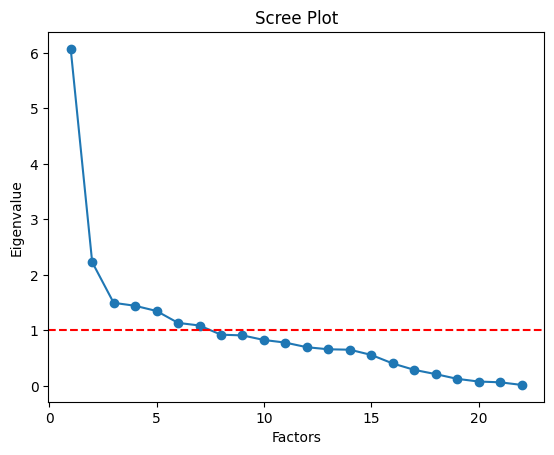

In [76]:
from factor_analyzer import FactorAnalyzer

# Perform Factor Analysis without specifying the number of factors
fa = FactorAnalyzer(rotation=None, use_smc=True)
fa.fit(df_combine_scaled)

# Check eigenvalues
eigenvalues, _ = fa.get_eigenvalues()
print("Eigenvalues:\n", eigenvalues)

# Plot the scree plot
plt.scatter(range(1, len(eigenvalues) + 1), eigenvalues)
plt.plot(range(1, len(eigenvalues) + 1), eigenvalues)
plt.title("Scree Plot")
plt.xlabel("Factors")
plt.ylabel("Eigenvalue")
plt.axhline(y=1, color="r", linestyle="--")
plt.show()


Actual Eigenvalues:
 [6.07332121 2.23030062 1.49669294 1.44297682 1.34905895 1.13467185
 1.08750279 0.92166187 0.90938942 0.82659776 0.77906503 0.69609524
 0.65880808 0.65116997 0.557111   0.40302878 0.28798773 0.21108041
 0.12591361 0.07753756 0.06357398 0.01645437]
Random Eigenvalues:
 [1.16120792 1.13599658 1.11565537 1.1000294  1.08357637 1.07030689
 1.05517823 1.04273802 1.03003955 1.01742781 1.0041297  0.99161108
 0.97883009 0.96764804 0.95422689 0.94126481 0.9293451  0.91569065
 0.90204408 0.88604999 0.86961369 0.84738976]


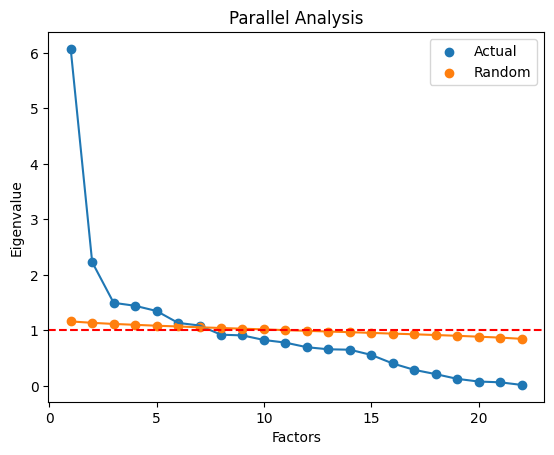

In [77]:
# Perform parallel analysis
def parallel_analysis(data, n_iterations=100):
    n_rows, n_cols = data.shape
    random_eigenvalues = []

    for _ in range(n_iterations):
        random_data = np.random.normal(size=(n_rows, n_cols))
        fa = FactorAnalyzer(rotation=None)
        fa.fit(random_data)
        eigenvalues, _ = fa.get_eigenvalues()
        random_eigenvalues.append(eigenvalues)

    random_eigenvalues = np.mean(random_eigenvalues, axis=0)
    return random_eigenvalues


# Get random eigenvalues
random_eigenvalues = parallel_analysis(df_combine_scaled)

# Compare with actual eigenvalues
print("Actual Eigenvalues:\n", eigenvalues)
print("Random Eigenvalues:\n", random_eigenvalues)

# Plot comparison
plt.scatter(range(1, len(eigenvalues) + 1), eigenvalues, label="Actual")
plt.plot(range(1, len(eigenvalues) + 1), eigenvalues)
plt.scatter(range(1, len(random_eigenvalues) + 1), random_eigenvalues, label="Random")
plt.plot(range(1, len(random_eigenvalues) + 1), random_eigenvalues)
plt.title("Parallel Analysis")
plt.xlabel("Factors")
plt.ylabel("Eigenvalue")
plt.axhline(y=1, color="r", linestyle="--")
plt.legend()
plt.show()


In [78]:
## Eigen value and factor loading
# Perform Factor Analysis
fa = FactorAnalyzer(n_factors=7, rotation=None)
fa.fit(df_combine_scaled)

# Extract factor loadings
loadings = fa.loadings_

# Extract eigenvalues
eigenvalues, _ = fa.get_eigenvalues()

# Create a DataFrame for factor loadings
factor_loadings_df = pd.DataFrame(
    loadings,
    index=df_combine_scaled.columns,
    columns=[f"Factor {i + 1}" for i in range(7)],
)

# Create a DataFrame for eigenvalues
eigenvalues_df = pd.DataFrame(
    {"Factor": [f"Factor {i + 1}" for i in range(7)], "Eigenvalue": eigenvalues[:7]}
)
eigenvalues_df.set_index("Factor", inplace=True)

print("Factor Loadings:")
print(factor_loadings_df)
print("\nEigenvalues:")
print(eigenvalues_df)


Factor Loadings:
                Factor 1  Factor 2  Factor 3  Factor 4  Factor 5  Factor 6  \
Temperature©    0.018700 -0.066913 -0.037580  0.181196  0.030455  0.081978   
Turbidity(NTU)  0.136155 -0.003426  0.181523  0.007387  0.262917 -0.237085   
pH              0.122473  0.038327  0.156366 -0.004902  0.364201 -0.311260   
ORP(mv)        -0.079027 -0.003930 -0.271993  0.378349 -0.165724  0.389580   
EC(µS/cm)       0.668909 -0.665381  0.106966  0.014506  0.022773  0.069921   
Salinity(ppt)   0.585405 -0.699358  0.139451  0.004764  0.035277  0.047722   
DO(mg/l)       -0.009823  0.014662  0.073611 -0.009290  0.053619 -0.060958   
TDS(mg/l)       0.621563 -0.719662  0.135768  0.009037  0.044425  0.084038   
Na(meq/l)       0.892812  0.102790 -0.353381 -0.009255 -0.082850 -0.150870   
K(meq/l)        0.817994  0.190903 -0.112417 -0.045376  0.014716  0.067328   
Mg2(meq/l)      0.653022  0.322172  0.431052  0.197523 -0.161150  0.042698   
Ca2(meq/l)      0.581705  0.239800  0.377886  0

In [79]:
# Calculate communality for each variable
communalities = np.sum(factor_loadings_df**2, axis=1)

# Create a DataFrame for communalities
communalities_df = pd.DataFrame(communalities, columns=["Communality"])

print("Communalities:")
print(communalities_df)

Communalities:
                Communality
Temperature©       0.066509
Turbidity(NTU)     0.257855
pH                 0.350418
ORP(mv)            0.582477
EC(µS/cm)          0.907476
Salinity(ppt)      0.854830
DO(mg/l)           0.078457
TDS(mg/l)          0.932393
Na(meq/l)          0.962421
K(meq/l)           0.726899
Mg2(meq/l)         0.783122
Ca2(meq/l)         0.731985
Cl(meq/l)          0.996992
HCO3(meq/l)        0.581040
CO3(meq/l)         0.482258
SO42(meq/l)        0.207069
NO3(meq/l)         0.326172
PO43(meq/l)        0.396941
Fe2(meq/l)         0.459045
Mn2(meq/l)         0.136976
B(meq/l)           0.075010
SAR                0.893335


In [80]:
# selected parameters
selected_parameters = ["EC(µS/cm)", "SAR", "Na(meq/l)", "Cl(meq/l)", "HCO3(meq/l)"]

# Filter factor loadings for selected parameter

selected_parameters_loadings = factor_loadings_df.loc[selected_parameters]

In [81]:
# Extract eigenvalues as a numpy array
eigenvalues = eigenvalues_df["Eigenvalue"].values

# Calculate the numerator: sum(F_j * A_ij) for each parameter
numerator = np.sum(selected_parameters_loadings * eigenvalues.reshape(1, -1), axis=1)

# Calculate the denominator: sum(F_j * A_ij) for all parameters
denominator = np.sum(factor_loadings_df.values * eigenvalues.reshape(1, -1))

# Calculate weights
weights = numerator / denominator

# Create a dictionary of weights
weights_dict = dict(zip(selected_parameters, weights))

print("Weights:\n", weights_dict)


Weights:
 {'EC(µS/cm)': 0.04649798391962572, 'SAR': 0.07481945808207384, 'Na(meq/l)': 0.07845392433861445, 'Cl(meq/l)': 0.0805540329526358, 'HCO3(meq/l)': 0.08050262727236983}


In [82]:
# Normalize weights and round to 3 decimal places
weights_dict = {
    k: round(v / sum(weights_dict.values()), 3) for k, v in weights_dict.items()
}

print("Normalized Weights (3 decimal places):\n", weights_dict)


Normalized Weights (3 decimal places):
 {'EC(µS/cm)': 0.129, 'SAR': 0.207, 'Na(meq/l)': 0.217, 'Cl(meq/l)': 0.223, 'HCO3(meq/l)': 0.223}


### Irrigation Water quality index

$$
q_i=q_{max}-\left[\frac{\left(x_{ij}-x_{inf}\right)\times q_{imap}}{x_{amp}}\right]
$$

$$
IWQI\ =\sum_{i=1}^{n}q_iw_i
$$


In [83]:
weights_dict

{'EC(µS/cm)': 0.129,
 'SAR': 0.207,
 'Na(meq/l)': 0.217,
 'Cl(meq/l)': 0.223,
 'HCO3(meq/l)': 0.223}

In [84]:
# Define class information with ranges, q_max, q_amp
classes = {
    "EC(µS/cm)": [
        (200, 750, 100, 15),
        (750, 1500, 85, 25),
        (1500, 3000, 60, 25),
        (0, 200, 35, 35),
        (3000, float("inf"), 35, 35),
    ],
    "SAR": [
        (2, 3, 100, 15),
        (3, 6, 85, 25),
        (6, 12, 60, 25),
        (0, 2, 35, 35),
        (12, float("inf"), 35, 35),
    ],
    "Na(meq/l)": [
        (2, 3, 100, 15),
        (3, 6, 85, 25),
        (6, 9, 60, 25),
        (0, 2, 35, 35),
        (9, float("inf"), 35, 35),
    ],
    "Cl(meq/l)": [
        (1, 4, 100, 15),
        (4, 7, 85, 25),
        (7, 10, 60, 25),
        (0, 1, 35, 35),
        (10, float("inf"), 35, 35),
    ],
    "HCO3(meq/l)": [
        (1, 1.5, 100, 15),
        (1.5, 4.5, 85, 25),
        (4.5, 8.5, 60, 25),
        (0, 1, 35, 35),
        (8.5, float("inf"), 35, 35),
    ],
}


In [85]:
def qi(value, parameter):
    class_info = classes[parameter]
    for lower, upper, qmax, qamp in class_info:
        if (
            lower <= value < upper
            or (upper == float("inf") and value >= lower)
            or (lower == 0 and value < upper)
        ):
            xinf = lower
            if upper == float("inf") or lower == 0:
                xamp = max(
                    upper for upper, _, _, _ in class_info if upper != float("inf")
                ) - min(lower for lower, _, _, _ in class_info if lower != 0)
            else:
                xamp = upper - lower
            qi = qmax - (((value - xinf) * qamp) / xamp)
            return max(0, qi)
    return 0


def calculate_all_qi(df):
    qi_df = df[selected_parameters].copy()
    for column in df.columns:
        qi_df[column] = df[column].apply(lambda x: qi(x, column))
    return qi_df


In [86]:
df_dry_sel = df_dry[selected_parameters]
df_wet_sel = df_wet[selected_parameters]

df_dry_qi = calculate_all_qi(df_dry_sel)
df_wet_qi = calculate_all_qi(df_wet_sel)

df_dry_qi.head(5)

,EC(µS/cm),SAR,Na(meq/l),Cl(meq/l),HCO3(meq/l)
0,59.333333,44.567166,0.000000,3.954709,51.262086
1,67.933333,59.323815,19.688995,27.814606,60.845351
2,0.562500,37.935761,6.583297,25.620592,53.761267
3,55.600000,34.182071,0.000000,0.000000,73.341254
4,0.000000,0.000000,0.000000,0.000000,67.509833


In [87]:
df_wet_qi.head(5)

,EC(µS/cm),SAR,Na(meq/l),Cl(meq/l),HCO3(meq/l)
0,71.733333,40.800150,0.000000,20.793763,38.141388
1,66.866667,70.610936,34.473032,46.424542,50.637291
2,67.133333,48.243993,15.513702,38.008933,41.890159
3,68.966667,96.513230,66.501740,63.255759,40.640569
4,9.262500,13.700687,0.000000,0.000000,19.151535


In [88]:
# function for calculate IWQI


def iwqi(row, weights):
    iwqi_value = 0
    for parameter, weight in weights.items():
        qi_value = row[parameter]
        iwqi_value += qi_value * weight
    return iwqi_value

In [111]:
# for wet season
df_wet["IWQI"] = df_wet_qi.apply(lambda row: iwqi(row, weights_dict), axis=1)

df_wet["IWQI_category"] = ""

# Iterate through the dataframe and categorize based on IWQI
for index, row in df_wet.iterrows():
    if 85 <= row["IWQI"] <= 100:
        df_wet.loc[index, "IWQI_category"] = "No Restriction"
    elif 70 <= row["IWQI"] < 85:
        df_wet.loc[index, "IWQI_category"] = "Low Restriction"
    elif 55 <= row["IWQI"] < 70:
        df_wet.loc[index, "IWQI_category"] = "Moderate Restriction"
    elif 40 <= row["IWQI"] < 55:
        df_wet.loc[index, "IWQI_category"] = "High Restriction"
    else:
        df_wet.loc[index, "IWQI_category"] = "Severe Restriction"

df_wet.head(5)


,OBJECTID,Sample ID,Division,District,Upazila,soil tract,GST_LABEL,GST_CODE,Depth Category,Depth(m),...,KI(meq/l),KI_category,RSC(meq/l),RSC_category,PS(meq/l),PS_category,TH(mg/l as CaCO3),TH_category,IWQI,IWQI_category
0,1,BABAPZ-1/1,Khulna,Bagerhat,Bagerhat_x000D_\nSadar,Delta (Tidal),Calcareous Dark Grey Floodplain Soils,5,Intermediate Aquifer,175.0,...,3.481640,Unsuitable,3.355792,Unsuitable,13.701867,Moderate,232.228646,Hard,30.841770,Severe Restriction
1,2,BABAPZ-2,Khulna,Bagerhat,Bagerhat_x000D_\nSadar,Delta (Tidal),Calcareous Dark Grey Floodplain Soils,5,Deep Aquifer,240.0,...,1.226832,Unsuitable,-1.423841,Good,8.635488,Moderate,371.353315,Very Hard,52.367700,High Restriction
2,3,BABAPZ-3,Khulna,Bagerhat,Bagerhat_x000D_\nSadar,Delta (Tidal),Calcareous Dark Grey Floodplain Soils,5,Deep Aquifer,278.0,...,3.016836,Unsuitable,3.522413,Unsuitable,9.647058,Moderate,213.883659,Hard,39.830677,Severe Restriction
3,4,BABAPZ-4,Khulna,Bagerhat,Bagerhat_x000D_\nSadar,Delta (Tidal),Calcareous Dark Grey Floodplain Soils,5,Shallow Aquifer,30.0,...,0.477398,Good,-3.336320,Good,7.338020,Moderate,547.056094,Very Hard,66.474697,Moderate Restriction
4,5,BAMHLW-1,Khulna,Bagerhat,Mollahat,Ganges (Active),Calcareous Brown Floodplain Soils,3,Intermediate Aquifer,85.0,...,4.204825,Unsuitable,2.646218,Unsuitable,40.657264,Unsuitable,462.787084,Very Hard,8.301697,Severe Restriction


In [105]:
# for wet season
df_dry["IWQI"] = df_dry_qi.apply(lambda row: iwqi(row, weights_dict), axis=1)

df_dry["IWQI_category"] = ""

# Iterate through the dataframe and categorize based on IWQI
for index, row in df_dry.iterrows():
    if 85 <= row["IWQI"] <= 100:
        df_dry.loc[index, "IWQI_category"] = "No restriction"
    elif 70 <= row["IWQI"] < 85:
        df_dry.loc[index, "IWQI_category"] = "Low restriction"
    elif 55 <= row["IWQI"] < 70:
        df_dry.loc[index, "IWQI_category"] = "Moderate restriction"
    elif 40 <= row["IWQI"] < 55:
        df_dry.loc[index, "IWQI_category"] = "High restriction"
    else:
        df_dry.loc[index, "IWQI_category"] = "Severe restriction"

df_dry.head(5)


,OBJECTID,Sample ID,Division,District,Upazila,soil tract,GST_LABEL,GST_CODE,Depth Category,Depth(m),...,KI(meq/l),KI_category,RSC(meq/l),RSC_category,PS(meq/l),PS_category,TH(mg/l as CaCO3),TH_category,IWQI,IWQI_category
0,1,BABAPZ-1/1,Khulna,Bagerhat,Bagerhat_x000D_\nSadar,Delta (Tidal),Calcareous Dark Grey Floodplain Soils,5,Intermediate Aquifer,175,...,2.896599,Unsuitable,1.086366,Good,18.847118,Unsuitable,280.76266,Hard,29.192749,Severe restriction
1,2,BABAPZ-2,Khulna,Bagerhat,Bagerhat_x000D_\nSadar,Delta (Tidal),Calcareous Dark Grey Floodplain Soils,5,Deep Aquifer,240,...,1.574080,Unsuitable,-3.264456,Good,12.732536,Moderate,383.39302,Very Hard,45.087112,High restriction
2,3,BABAPZ-3,Khulna,Bagerhat,Bagerhat_x000D_\nSadar,Delta (Tidal),Calcareous Dark Grey Floodplain Soils,5,Deep Aquifer,278,...,4.344599,Unsuitable,3.318320,Unsuitable,13.317532,Moderate,169.07203,Hard,27.055995,Severe restriction
3,4,BABAPZ-4,Khulna,Bagerhat,Bagerhat_x000D_\nSadar,Delta (Tidal),Calcareous Dark Grey Floodplain Soils,5,Shallow Aquifer,16.37,...,1.960211,Unsuitable,-16.576043,Good,40.895265,Unsuitable,974.42397,Very Hard,30.603188,Severe restriction
4,5,BABAPZ-5,Khulna,Bagerhat,Bagerhat_x000D_\nSadar,Delta (Tidal),Calcareous Dark Grey Floodplain Soils,5,Deep Aquifer,290,...,5.083898,Unsuitable,-12.621654,Good,104.294419,Unsuitable,811.55829,Very Hard,15.054693,Severe restriction


In [112]:
def summary_iwqi(df, title=""):
    print(f"\n=== IWQI Summary: {title} ===")

    print(df["Depth Category"].value_counts())
    print(df["IWQI_category"].value_counts())

    table = pd.pivot_table(
        df,
        values="IWQI",
        index=["IWQI_category"],
        columns=["Depth Category"],
        aggfunc="count",
    )

    print(table)


In [113]:
summary_iwqi(df_wet, "Wet Season")
summary_iwqi(df_dry, "Dry Season")


=== IWQI Summary: Wet Season ===
Depth Category
Intermediate Aquifer    398
Shallow Aquifer         384
Deep Aquifer            119
Name: count, dtype: int64
IWQI_category
Moderate Restriction    326
Severe Restriction      258
High Restriction        194
Low Restriction          97
No Restriction           26
Name: count, dtype: int64
Depth Category        Deep Aquifer  Intermediate Aquifer  Shallow Aquifer
IWQI_category                                                            
High Restriction                23                    67              104
Low Restriction                 15                    45               37
Moderate Restriction            37                   126              163
No Restriction                   5                    13                8
Severe Restriction              39                   147               72

=== IWQI Summary: Dry Season ===
Depth Category
Intermediate Aquifer    396
Shallow Aquifer         386
Deep Aquifer            127
Name: coun